In [17]:
%matplotlib inline

#system
import os
import glob

#math
import numpy as np

#video and image
import cv2
import moviepy
from moviepy.editor import VideoFileClip

#display
import matplotlib.pyplot as plt
import matplotlib.image as mplimg
from matplotlib.patches import Polygon


# Camera Calibration

In [18]:
class CameraCalibration(object):
    '''
    class containing camera calibration constants and perspective transform matrices
    '''
    def __init__(self, 
                 filepaths, 
                 chessboard_dim=(9, 6)):        
        # chessboard dimensions
        self.nx = chessboard_dim[0]
        self.ny = chessboard_dim[1]
        # camera image dimensions
        self.H = None
        self.W = None
        # list of filepaths of calibration images
        self.fpaths = filepaths
        # camera calibration coefficients
        self.iscalibrated, self.mtx, self.dist, self.rvecs, self.tvecs = self._calibrate_camera()
        
        # perspective transform points
        self.src = None
        self.dst = None
        self.M = None
        self.Minv = None
        
    def _calibrate_camera(self):
        # Arrays to store object points and image points from all the images.
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.

        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((self.nx * self.ny,3), np.float32)
        objp[:,:2] = np.mgrid[0:self.nx, 0:self.ny].T.reshape(-1,2)

        # Step through the list and search for chessboard corners
        for fname in self.fpaths:
            #convert to gray
            img = cv2.imread(fname)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            #..record image dimensions if none exists yet
            if self.H is None or self.W is None:
                self.H, self.W = gray.shape
            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (self.nx, self.ny),None)
            # If found, add object points, image points
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)

        # get camera calibration constants
        return cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
    def calculate_warp_matrices(self, src, dst):
        self.src = src
        self.dst = dst
        self.M = cv2.getPerspectiveTransform(src, dst)
        self.Minv = cv2.getPerspectiveTransform(dst, src)
        
    def warp_image(self, img):
        return cv2.warpPerspective(img, self.M, (self.W, self.H), flags=cv2.INTER_LINEAR)
    
    def unwarp_image(self, img):
        return cv2.warpPerspective(img, self.Minv, (self.W, self.H), flags=cv2.INTER_LINEAR)        
    

In [19]:
# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# create calibration instance
CC = CameraCalibration(images)

#check if calibrated
print(CC.iscalibrated)


1.1868973603423731


### Test extracted camera calibration coefficients on undistorting images

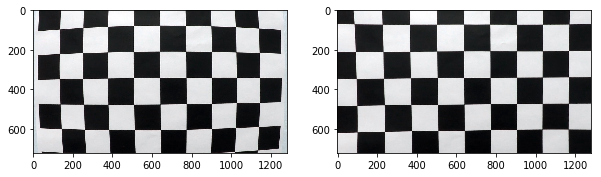

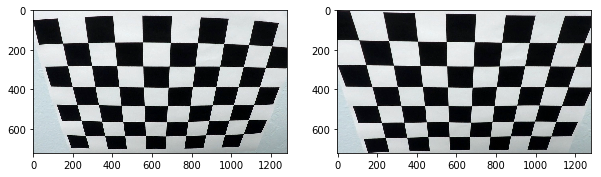

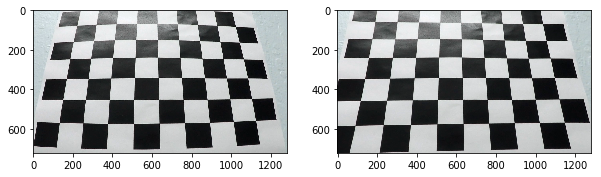

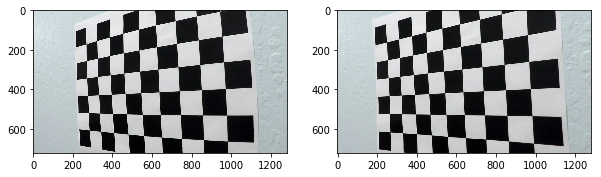

In [20]:
#test camera calibration
for i in range(1,5):
    calibration_img = cv2.imread('camera_cal/calibration{}.jpg'.format(i))
    undistorted_img = cv2.undistort(calibration_img, CC.mtx, CC.dist, None, CC.mtx)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,20))
    ax1.imshow(calibration_img)
    ax2.imshow(undistorted_img)

In [21]:
# def perspective_transform(img, M):
#     img_size = (img.shape[1], img.shape[0])
#     warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
#     return warped

src = np.float32([[574, 462], # top left
                  [243, 684], # bottom left
                  [1056, 679], # bottom right
                  [704, 462]]) # top right
offset = 250
dst = np.float32([[offset, 100],      
                  [offset, CC.H],
                  [CC.W-offset, CC.H],
                  [CC.W-offset, 100]])
# M = cv2.getPerspectiveTransform(src, dst)
CC.calculate_warp_matrices(src, dst)


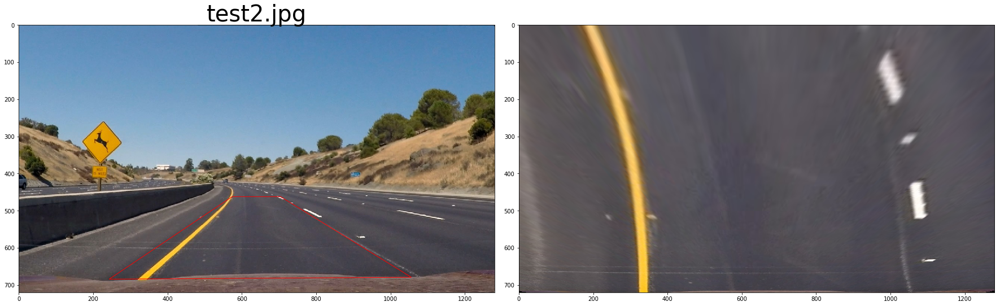

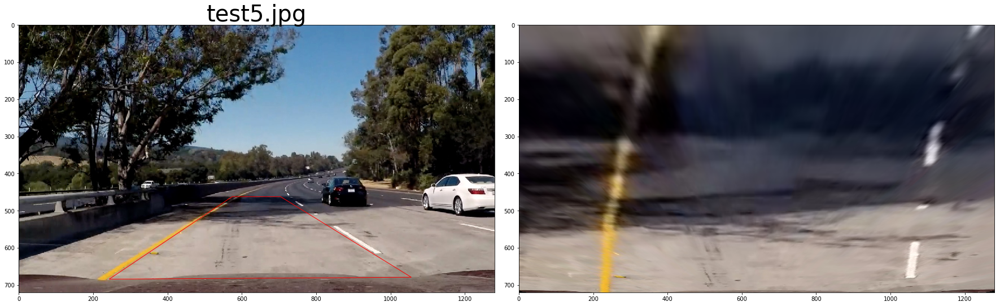

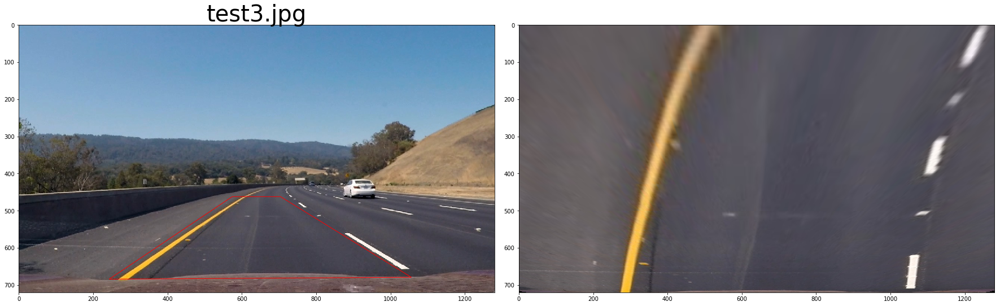

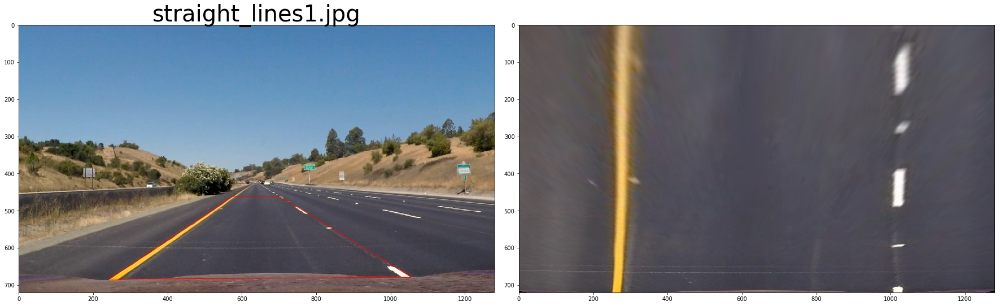

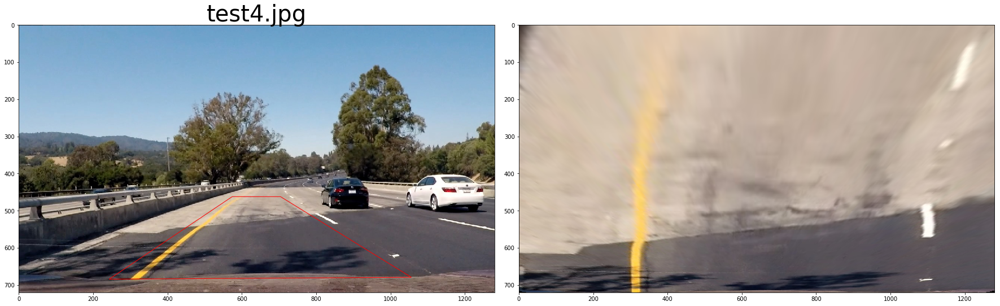

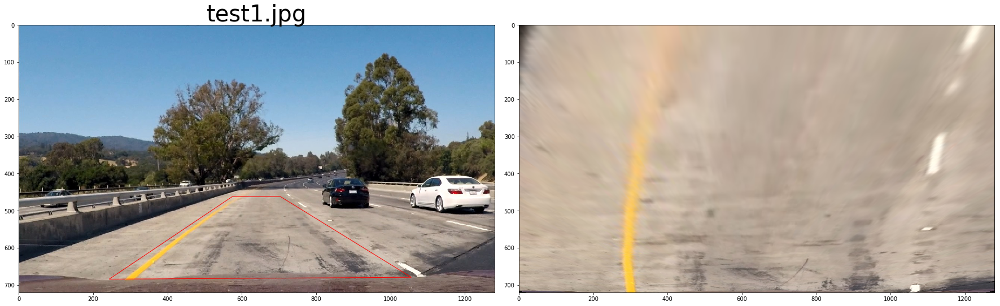

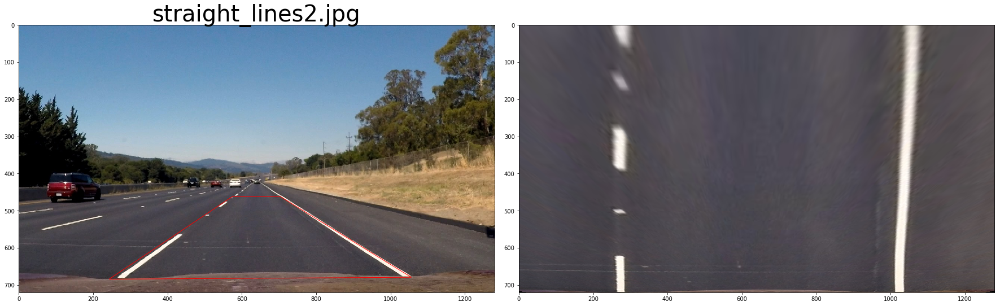

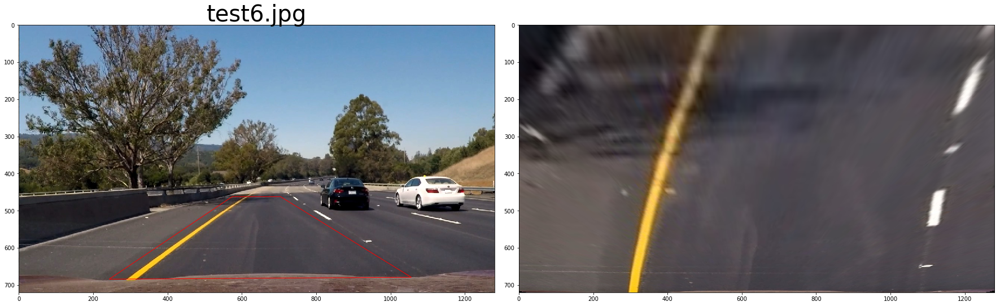

In [22]:
x_pts, y_pts = zip(*src)
for fname in os.listdir('test_images/'):
    image = mplimg.imread('test_images/' + fname)
    warped = CC.warp_image(image)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.add_patch(Polygon(CC.src, fill=False, edgecolor='r'))
    ax1.set_title(fname, fontsize=40)

    ax2.imshow(warped)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Convert to binary image 

In [23]:
def convert_to_binary(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1)] = 1
    
    return combined_binary


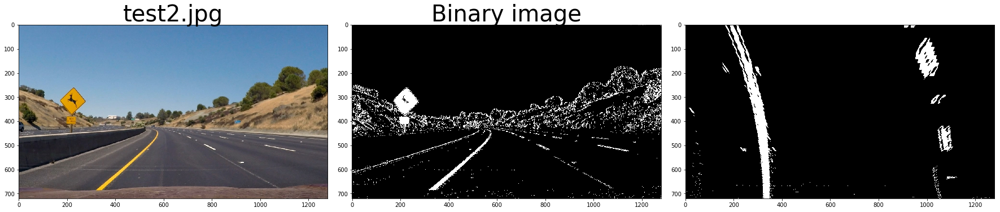

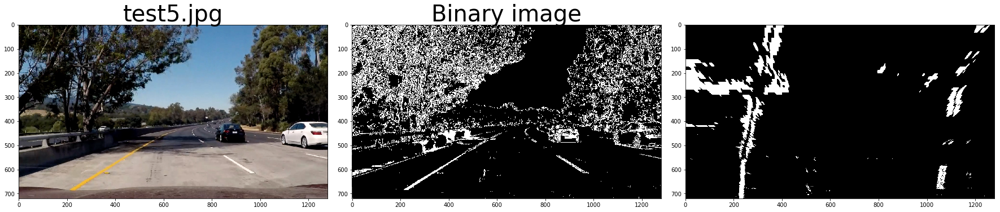

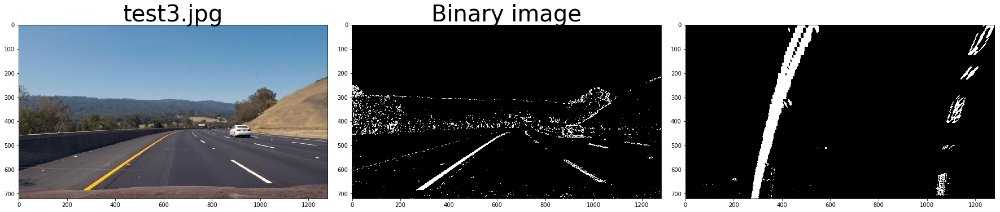

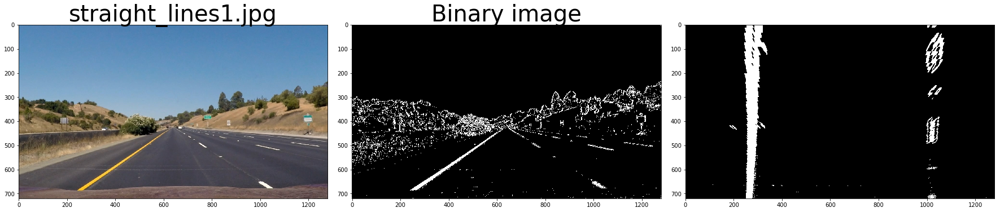

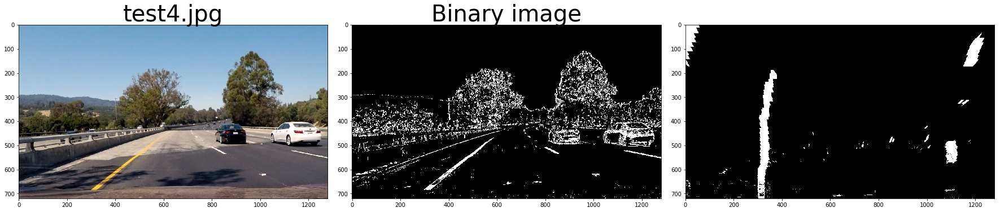

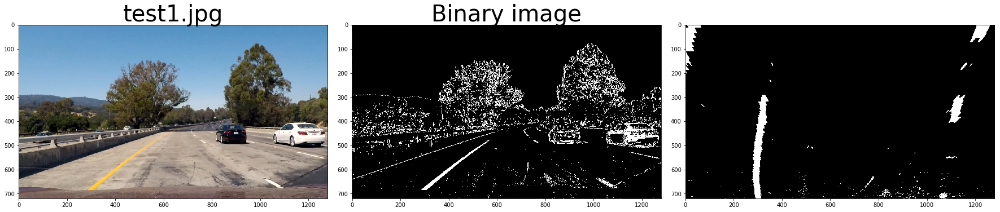

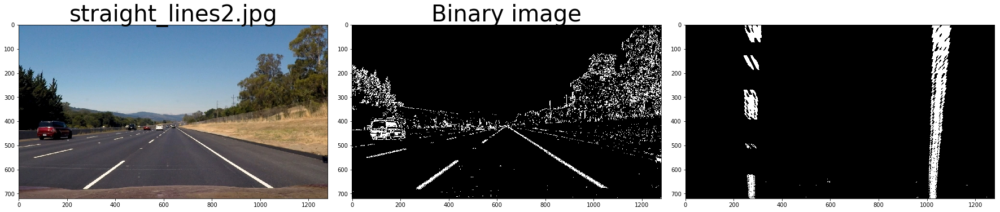

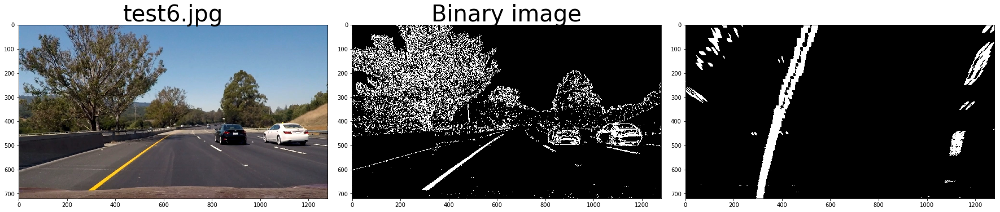

In [24]:
for fname in os.listdir('test_images/'):
    image = mplimg.imread('test_images/' + fname)
    binary = convert_to_binary(image)
    binary_warped = CC.warp_image(binary)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title(fname, fontsize=40)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary image', fontsize=40)
    ax3.imshow(binary_warped, cmap='gray')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Extract lines and make polynomial fit

In [29]:
class LaneLine(object):
    '''class that holds data describing a line extracted from a binary warped image'''
    def __init__(self):
        self.x = None
        self.y = None
        self.fit = None
        self.x_current = None
        self.lane_inds = []
        
def find_lane_pixels(binary_warped, left=None, right=None):
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 8
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    #initialize variables
    H, W = binary_warped.shape
    if left is None:
        left = LaneLine()
    if right is None:
        right = LaneLine()
    
    # Set height of windows - based on nwindows above and image shape
    win_h = np.int(binary_warped.shape[0]//nwindows)
    # window starting points
    divs = np.linspace(H, 0, nwindows).astype(int)

    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated later for each window in nwindows\
    histogram = np.sum(binary_warped[H//2:, :], axis=0)
    midpoint = len(histogram)//2
#     leftx_current = np.argmax(histogram[:midpoint]).astype(int)
#     rightx_current = np.argmax(histogram[midpoint:]).astype(int) + midpoint
    left.x_current = np.argmax(histogram[:midpoint]).astype(int)
    right.x_current = np.argmax(histogram[midpoint:]).astype(int) + midpoint
    
    # Create empty lists to receive left and right lane pixel indices
#     left_lane_inds = []
#     right_lane_inds = []

    out_img = np.dstack([binary_warped * 255] * 3)

    for d in divs[:-1]:
        for lane in [left, right]:
            #window coordinates
            win_y_low = d - win_h
            win_y_high = d 
#             win_xleft_low = leftx_current - margin  
#             win_xleft_high = leftx_current + margin  
#             win_xright_low = rightx_current - margin  
#             win_xright_high = rightx_current + margin
            win_x_low = lane.x_current - margin  
            win_x_high = lane.x_current + margin  

            # Draw the windows on the visualization image
#             cv2.rectangle(out_img,(win_xleft_low,win_y_low),
#             (win_xleft_high,win_y_high),(0,255,0), 2) 
#             cv2.rectangle(out_img,(win_xright_low,win_y_low),
#             (win_xright_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_x_low,win_y_low),
            (win_x_high,win_y_high),(0,255,0), 2) 

#             good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
#                               (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
#             good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
#                               (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                         (nonzerox >= win_x_low) & (nonzerox < win_x_high)).nonzero()[0]

#             left_lane_inds.append(good_left_inds)
#             right_lane_inds.append(good_right_inds)
            lane.lane_inds.append(good_right_inds)

            #update x_coords
#             if np.sum(good_left_inds) > minpix:
#                 leftx_current = int(np.mean(nonzerox[good_left_inds]))
#             if np.sum(good_right_inds) > minpix:
#                 rightx_current = int(np.mean(nonzerox[good_right_inds]))
            if np.sum(good_inds) > minpix:
                lane.x_current = int(np.mean(nonzerox[good_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
#         left_lane_inds = np.concatenate(left_lane_inds)
#         right_lane_inds = np.concatenate(right_lane_inds)
        left_lane_inds = np.concatenate(left.lane_inds)
        right_lane_inds = np.concatenate(right.lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    left.x = nonzerox[left_lane_inds]
    left.y = nonzeroy[left_lane_inds] 
    right.x = nonzerox[right_lane_inds]
    right.y = nonzeroy[right_lane_inds]

    return left, right, out_img
    


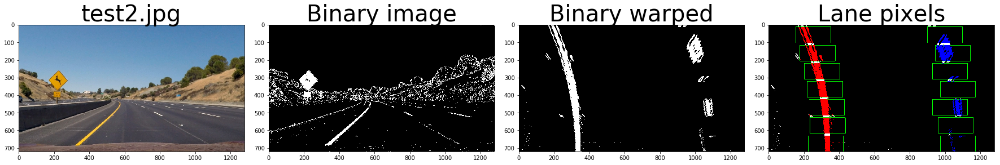

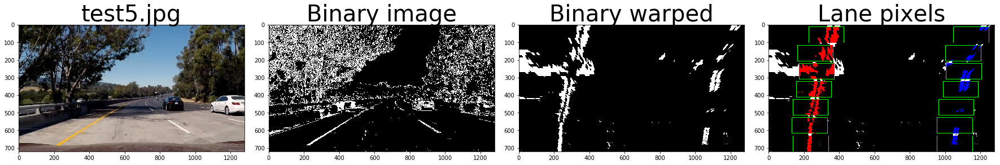

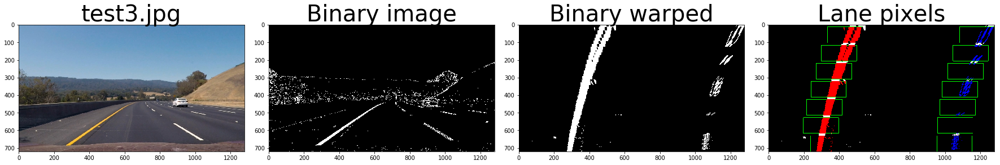

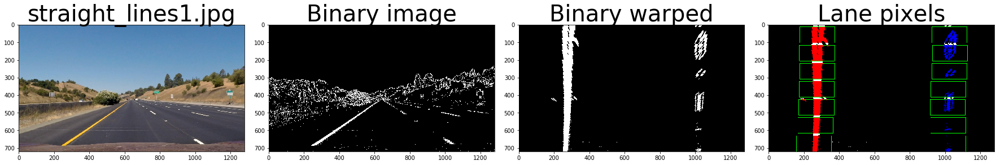

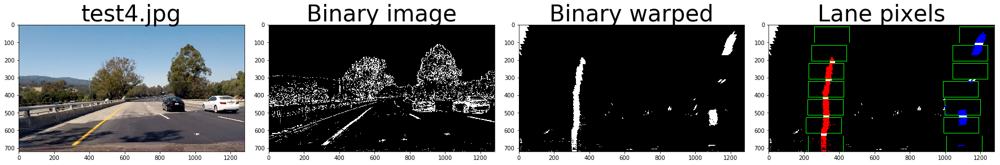

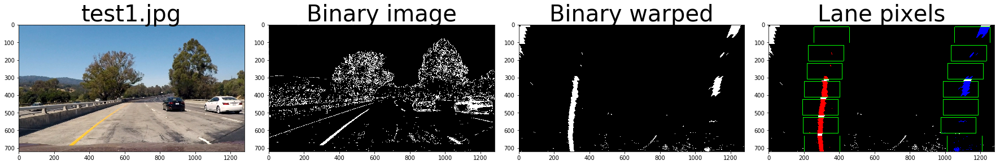

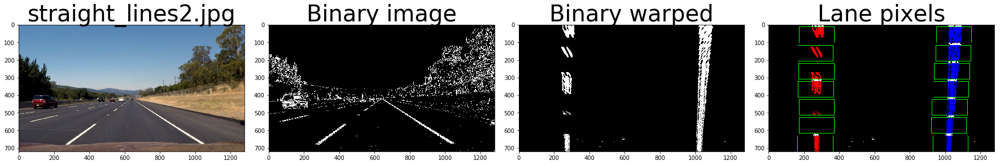

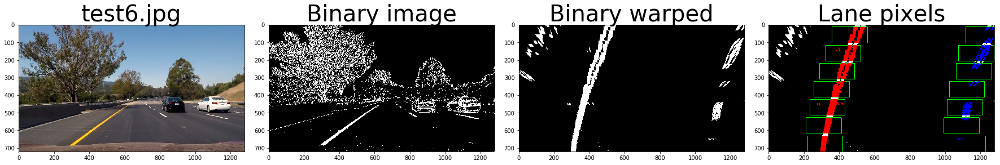

In [30]:
# #test image
# image = cv2.imread('test_images/test6.jpg')
# #image -> binary -> perspective transform
# binary = convert_to_binary(image)
# binary_warped = perspective_transform(binary)

for fname in os.listdir('test_images/'):
    image = mplimg.imread('test_images/' + fname)
    binary = convert_to_binary(image)
    binary_warped = CC.warp_image(binary)
    
#     leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    left, right, out_img = find_lane_pixels(binary_warped)

    #visualize
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title(fname, fontsize=40)
    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary image', fontsize=40)
    ax3.imshow(binary_warped, cmap='gray')
    ax3.set_title('Binary warped', fontsize=40)
    ax4.imshow(out_img)
    ax4.set_title('Lane pixels', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Fit polynomial

In [ ]:
#calculate polynomial coefficients
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
try:
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
except TypeError:
    # Avoids an error if `left` and `right_fit` are still none or incorrect
    print('The function failed to fit a line!')
    left_fitx = 1*ploty**2 + 1*ploty
    right_fitx = 1*ploty**2 + 1*ploty
     
## Visualization ##
# Colors in the left and right lane regions
out_img = np.zeros_like(out_img)

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.vstack([left_fitx, ploty]).T])
pts_right = np.array([np.flipud(np.vstack([right_fitx, ploty]).T)])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(out_img, np.int_([pts]), (0,255, 0))
    
# Draw fitted lines
color = [255, 0, 0]
thickness = 5
cv2.polylines(out_img, np.int_([pts_left]), False, color, thickness)
cv2.polylines(out_img, np.int_([pts_right]), False, color, thickness)

plt.imshow(out_img)

# Radius of curvature

In [ ]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/np.mean(right_fitx - left_fitx) # meters per pixel in x dimension

# Define y-value where we want radius of curvature
# We'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty) * ym_per_pix

# Implement the calculation of R_curve (radius of curvature) 
left_curverad = ((1+(2*left_fit[0]*y_eval+left_fit[1])**2)**1.5)/(np.abs(2*left_fit[0]))
right_curverad = ((1+(2*right_fit[0]*y_eval+right_fit[1])**2)**1.5)/(np.abs(2*right_fit[0]))

print("left lane: {} m".format(left_curverad))
print("right lane: {} m".format(right_curverad))

In [ ]:
#unwarp mask
Minv = cv2.getPerspectiveTransform(dst, src)
img_size = (out_img.shape[1], mask.shape[0])
unwarped_mask = cv2.warpPerspective(mask, Minv, img_size, flags=cv2.INTER_LINEAR) 

#combine with original image
def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)
output = weighted_img(unwarped_mask, image)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 20))
ax1.imshow(unwarped_mask)
ax2.imshow(output)

# Processing pipeline

1. Correct for distortion
2. Transform RGB to binary image
3. Perform perspective transform to create "top view"
4. Polynomial fit on left and right lanes
5. Get R-curvature
